The following code is the attempt of analyzing the CT images without the datasets for applying much more possibilities to take advantage. Nevertheless, the research through analyzing the newest reports, libraries are required to achieve more.

###Loading data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%%bash

gsutil -m cp /content/drive/MyDrive/Artery-Segment-Stenosis.zip 

Copying file:///content/drive/MyDrive/Artery-Segment-Stenosis.zip...
-
Operation completed over 1 objects/118.6 MiB.                                    


In [ ]:
!unzip data/Artery-Segment-Stenosis.zip

Archive:  data/Artery-Segment-Stenosis.zip
 extracting: Artery-Segment-Stenosis/Description.docx  
 extracting: Artery-Segment-Stenosis/data/Im00746676/0789_Im00746676_00000.png  
 extracting: Artery-Segment-Stenosis/data/Im00746676/0789_Im00746676_00001.png  
 extracting: Artery-Segment-Stenosis/data/Im00746676/0789_Im00746676_00002.png  
 extracting: Artery-Segment-Stenosis/data/Im00746676/0789_Im00746676_00003.png  
 extracting: Artery-Segment-Stenosis/data/Im00746676/0789_Im00746676_00004.png  
 extracting: Artery-Segment-Stenosis/data/Im00746676/0789_Im00746676_00005.png  
 extracting: Artery-Segment-Stenosis/data/Im00746676/0789_Im00746676_00006.png  
 extracting: Artery-Segment-Stenosis/data/Im00746676/0789_Im00746676_00007.png  
 extracting: Artery-Segment-Stenosis/data/Im00746676/0789_Im00746676_00008.png  
 extracting: Artery-Segment-Stenosis/data/Im00746676/0789_Im00746676_00009.png  
 extracting: Artery-Segment-Stenosis/data/Im00746676/0789_Im00746676_00010.png  
 extractin

In [ ]:
!pip install SimpleITK

     |████████████████████████████████| 47.4MB 94kB/s 


In [ ]:
%matplotlib inline
import os
import numpy as np 
import SimpleITK as sitk
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import HTML
from matplotlib import animation
from skimage import measure
from PIL import Image

# constants 
INPUT_FOLDER = 'Artery-Segment-Stenosis/data/'
patients = os.listdir(INPUT_FOLDER)
patients.sort()

There are three CT scans:

In [ ]:
patients

['Im00746676', 'Im00751830', 'Im00752021']

In [ ]:
def plot_hu_histogram(ctvol):
    #Histogram of HUs https://www.kaggle.com/gzuidhof/full-preprocessing-tutorial
    plt.hist(ctvol.flatten(), bins=80, color='c')
    plt.xlabel("Hounsfield Units (HU)")
    plt.ylabel("Frequency")
    plt.show()

### Hounsfield unit (HU) 
We are doing a linear transformation of the original linear attenuation coefficient measurement into one in which the radiodensity of distilled water at standard pressure and temperature (STP) is defined as zero Hounsfield units (HU), while the radiodensity of air at STP is defined as −1000 HU.
We separete important part for analizing. For example, Foreign bodies, bones have HU+500, the air -1000.

To obtaine some conclusions requires to deep dive in the domain. Some substances have intersecting units.

In [ ]:
 def read_image(in_file):
    image = sitk.ReadImage(in_file)
    return image

def get_the_image_list(input_path):
    image_list = []
    image_name = []
    image_list_append = image_list.append
    image_name_append = image_name.append
    
    stats = sitk.StatisticsImageFilter()
    m = 0.

    if os.path.exists(input_path) and os.path.isdir(input_path):
        files = os.listdir(input_path)
        m = 0.
        for f in files:
            if f.endswith('png'):
                image = read_image(input_path + "/" + f)
                image_list_append(image)
                image_name_append(f)
                stats.Execute(image)
                m += stats.GetMean()
                
    return image_list, image_name, m


def get_pixels_hu(slices):
    image = np.stack([sitk.GetArrayFromImage(s) for s in slices])
    
    # Set outside-of-scan pixels to 1
    # The intercept is usually -1024, so air is approximately 0
    image[image == -2000] = 0

    image[image > 1200] = 0

    thresh_lo = -100
    thresh_hi = 400

    image = np.clip(image, thresh_lo, thresh_hi)

    
    #image = image / 255.

    return np.array(image, dtype=np.int16)

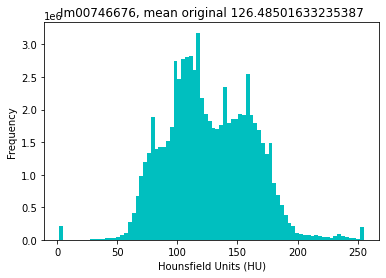

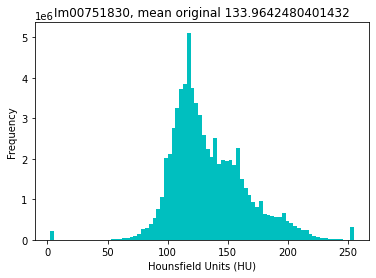

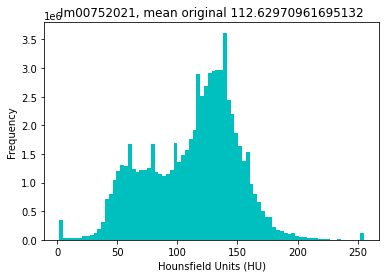

In [ ]:
slices_hu = []
slices = []
slices_names = []
slices_hu_append = slices_hu.append
slices_names_append = slices_names.append
slices_append = slices.append



for patient in patients:
    slices_, slices_names_, m = get_the_image_list(INPUT_FOLDER + patient)
    
    l = len(slices_)
    if l:
        meanIntensityTrain = m/l

        slices_names_append(slices_names_) 
        slices_append(slices_)
        slices_hu_ = get_pixels_hu(slices_)
        slices_hu_append(slices_hu_)
        plt.title(patient + ', mean original ' + str(meanIntensityTrain))
        plt.hist(slices_hu_.flatten(), bins=80, color='c')
        plt.xlabel("Hounsfield Units (HU)")
        plt.ylabel("Frequency")
        plt.show()

### Building functions to show CT images in the dynamic.

In [ ]:
def show_flow_slice(slice_):
    fig = plt.figure()
    plt.axis('off')
    myimages = []

    for s in slice_:
        img = sitk.GetArrayFromImage(s)
        img[img == -2000] = 0
        img[img > 1200] = 0

        thresh_lo = -100
        thresh_hi = 400

        img = np.clip(img, thresh_lo, thresh_hi)
        imgplot = plt.imshow(img, cmap='gray')

        # append AxesImage object to the list
        myimages.append([imgplot])
       
    ## create an instance of animation
    anim = animation.ArtistAnimation(fig, myimages, interval=60, repeat_delay=3000, blit=True)
    return anim

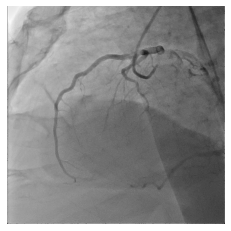

In [ ]:
anim_slice = show_flow_slice(slices[0])
HTML(anim_slice.to_jshtml())

In [ ]:
anim_slice.save(f'./images/{patients[0]}.mp4', writer = 'ffmpeg', fps = 30)  #'./data/Im00752021.mp4'

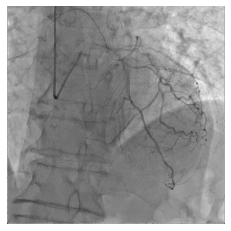

In [ ]:
anim_slice = show_flow_slice(slices[1])
HTML(anim_slice.to_jshtml())

In [ ]:
anim_slice.save(f'./images/{patients[1]}.mp4', writer = 'ffmpeg', fps = 30)  #'./data/Im00752021.mp4'

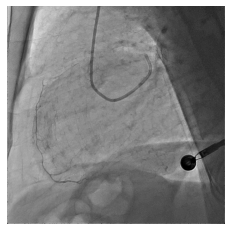

In [ ]:
anim_slice = show_flow_slice(slices[2])
HTML(anim_slice.to_jshtml())

In [ ]:
anim_slice.save(f'./images/{patients[2]}.mp4', writer = 'ffmpeg', fps = 30)  #'./data/Im00752021.mp4'

We take one slice includes most bright arteria to explore.

In [ ]:
slices_names[0].index('0789_Im00746676_00045.png')

44

In [ ]:
slice_1 = slices_hu[0][44]

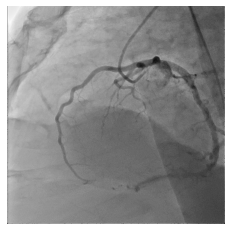

In [ ]:
plt.axis('off')
plt.imshow(slice_1, cmap='gray')

For regognazing edges and getting mask we can use "Mean thresholding algorithm".
In the results in the dark parts becoming completely black, and the white ones becoming completely white.

In [ ]:
"""
Mean thresholding algorithm for image processing
https://en.wikipedia.org/wiki/Thresholding_(image_processing)
"""
def mean_threshold(image: Image) -> Image:
    """
    image: is a grayscale PIL image object
    """
    height, width = image.size
    mean = 0
    pixels = image.load()
    for i in range(width):
        for j in range(height):
            pixel = pixels[j, i]
            mean += pixel
    mean //= width * height

    for j in range(width):
        for i in range(height):
            pixels[i, j] = 255 if pixels[i, j] > mean else 0
    return image

It does not work. A lof of darkness. We can try to clear the background

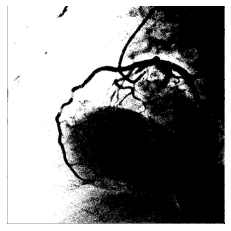

In [ ]:
plt.axis('off')
img = Image.fromarray(slice_1)
img = mean_threshold(img)
plt.imshow(img, cmap='gray')

Sharpen a blurred image:

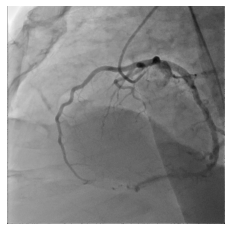

In [ ]:
from scipy import ndimage
plt.axis('off')
blurred_1 = ndimage.gaussian_filter(slice_1, 1)
plt.imshow(blurred_1, cmap='gray')

increase the weight of edges by adding an approximation of the Laplacian:

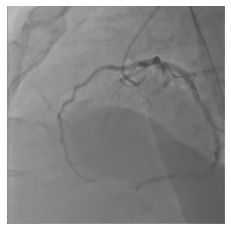

In [ ]:
filter_blurred_1 = ndimage.gaussian_filter(blurred_1, 1)
alpha = 7
sharpened = blurred_f + alpha * (blurred_1 - filter_blurred_1)
plt.axis('off')
plt.imshow(sharpened, cmap='gray')

 Getting the differences between the first segment and chosen

In [ ]:
len(slices_hu[0])# index len - 1

70

In [ ]:
slices_names[0].index('0789_Im00746676_00000.png')

52

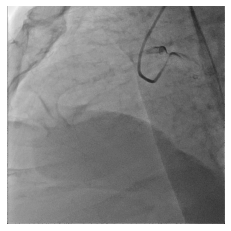

In [ ]:
image_first = slices_hu[0][52]
plt.axis('off')
plt.imshow(image_first, cmap='gray')

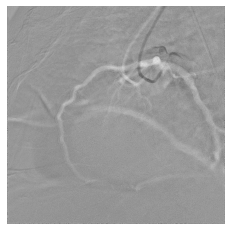

In [ ]:
dif = image_first - sharpened
plt.axis('off')
plt.imshow(dif, cmap='gray')

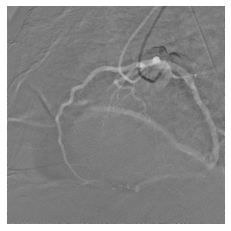

In [ ]:
dif = image_first - slice_1
plt.axis('off')
plt.imshow(dif, cmap='gray')

### Image manipulation and processing

Normalize the data(zero mean and unit variance). It can be used to prepare data to apply ML

In [ ]:
def get_normalized_segment(img, candy=1):

  img = sitk.GetImageFromArray(img)
  img = sitk.Cast(img, sitk.sitkFloat32)
  if candy:
    image_pre = sitk.CannyEdgeDetection(img)
    img = sitk.ShapeDetectionLevelSet(img, image_pre)

  corrector = sitk.N4BiasFieldCorrectionImageFilter()
  maskImage = sitk.OtsuThreshold(img, 0, 1, 200)
  output = corrector.Execute(img, maskImage)
  img = sitk.GetArrayFromImage(output)
  plt.axis('off')
  plt.imshow(img, cmap='gray')   
  return img 

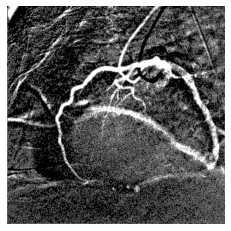

In [ ]:
im_canny = get_normalized_segment(dif)

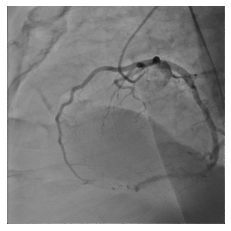

In [ ]:
im = get_normalized_segment(slice_1, candy=0)

In [ ]:
img.max()


25.210692983984035

In [ ]:
img.min()

-0.541517519685494

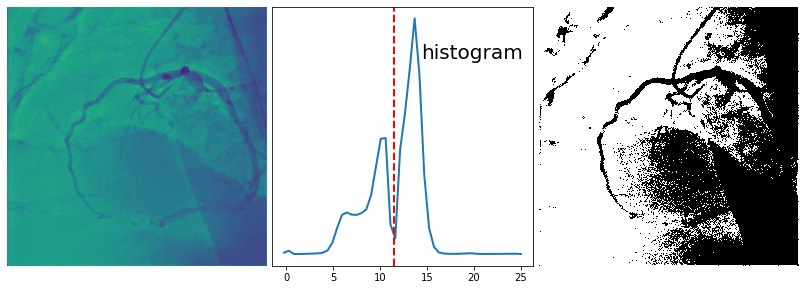

In [ ]:
mask = (im > im.mean()).astype(np.float)
mask += 0.1 * im
img = mask + 0.2*np.random.randn(*mask.shape)

hist, bin_edges = np.histogram(img, bins=50)
bin_centers = 0.5*(bin_edges[:-1] + bin_edges[1:])

binary_img = img > 11.5
plt.figure(figsize=(11,4))

plt.subplot(131)
plt.imshow(img)
plt.axis('off')
plt.subplot(132)
plt.plot(bin_centers, hist, lw=2)
plt.axvline(11.5, color='r', ls='--', lw=2)
plt.text(0.57, 0.8, 'histogram', fontsize=20, transform = plt.gca().transAxes)
plt.yticks([])
plt.subplot(133)
plt.imshow(binary_img, cmap=plt.cm.gray, interpolation='nearest')
plt.axis('off')

plt.subplots_adjust(wspace=0.02, hspace=0.3, top=1, bottom=0.1, left=0, right=1)
plt.show()

it still noisy. If we would get nice binary_image we applied mathematical morphology to clean up the our image

In [ ]:
import cv2
import copy
from google.colab.patches import cv2_imshow


class contrastStretch:
    def __init__(self):
        self.img = ""
        self.original_image = ""
        self.last_list = []
        self.rem = 0
        self.L = 256
        self.sk = 0
        self.k = 0
        self.number_of_rows = 0
        self.number_of_cols = 0

    def stretch(self, input_image):
        self.img = input_image
        self.original_image = copy.deepcopy(self.img)
        x, _, _ = plt.hist(self.img.ravel(), 256, [0, 256], label="x")
        self.k = np.sum(x)
        for i in range(len(x)):
            prk = x[i] / self.k
            self.sk += prk
            last = (self.L - 1) * self.sk
            if self.rem != 0:
                self.rem = int(last % last)
            last = int(last + 1 if self.rem >= 0.5 else last)
            self.last_list.append(last)
            self.number_of_rows = int(np.ma.count(self.img) / self.img[1].size)
            self.number_of_cols = self.img[1].size
        for i in range(self.number_of_cols):
            for j in range(self.number_of_rows):
                num = self.img[j][i]
                if num != self.last_list[num]:
                    self.img[j][i] = self.last_list[num]
 
    def plotHistogram(self):
        plt.hist(self.img.ravel(), 256, [0, 256])

    def showImage(self):
        #cv2_imshow(self.img) 
        plt.axis('off')
        plt.imshow(self.img, cmap='gray') 

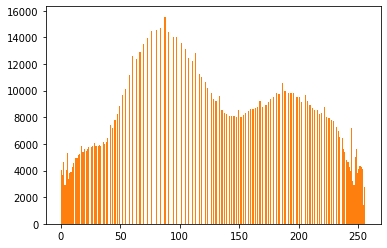

In [ ]:
stretcher = contrastStretch()
stretcher.stretch(slice_1)
stretcher.plotHistogram()

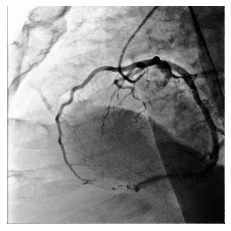

In [ ]:
stretcher.showImage()

It is much better. But we still have some regions are too similar in intensity.

We are dealing with 2D images. That project was the first attempt to learn the data. Work in progress. We didn't use so powerful given spatial information of CT slices.

We can explore using different parts of slices to obtain segments. Current CNN shows excited results to work with images.

Now ITK libriry fot image-processing is developing so fast. It would be great to try new possibilities.
https://pypi.org/project/itk/